In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2

import seaborn as sns

from skimage.feature import hog
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

from sklearn.linear_model import Perceptron
from sklearn.impute import SimpleImputer

from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB

from sklearn.ensemble import VotingClassifier

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.preprocessing import LabelEncoder

from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier, XGBRFClassifier

from sklearn.model_selection import GridSearchCV

import pickle as pkl

from sklearn.feature_selection import RFE

from skimage.feature import local_binary_pattern
from skimage.filters import gabor


from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

In [2]:
path = "C:\\Users\\bchaw\\Assignment_2-ML\\label.csv"
Y_df = pd.read_csv(path)

In [3]:
#relevent statistics 
#EDA
#number of unique classes 
unique_classes = [] 
for i in Y_df['label']:
    if i not in unique_classes:
        unique_classes.append(i)
print(f"The dataset contains {len(unique_classes)} unique classes")

The dataset contains 15 unique classes


In [4]:
#number of images per class 
print("The number of images per class are as follows:")
class_count = Y_df['label'].value_counts()
print(class_count)

The number of images per class are as follows:
label
sitting               840
using_laptop          840
hugging               840
sleeping              840
drinking              840
clapping              840
dancing               840
cycling               840
calling               840
laughing              840
eating                840
fighting              840
listening_to_music    840
running               840
texting               840
Name: count, dtype: int64


In [5]:
#common path to labels and data
common_path = "C:\\Users\\bchaw\\Assignment_2-ML\\"
#combine the path to perform further analysis on the images by iterating on each 
combined_image_path = os.path.join(common_path,"data")

image_size_set = set()
image_sizes = []
for file in os.listdir(combined_image_path):
    img = cv2.imread(os.path.join(combined_image_path,file))
    height,width,channels = img.shape
    image_size_set.add(f"{height} X {width}")
    image_sizes.append((height,width))
    print(f"Image Size : {height} X {width}")

Image Size : 160 X 240
Image Size : 168 X 299
Image Size : 167 X 301
Image Size : 192 X 263
Image Size : 183 X 275
Image Size : 168 X 299
Image Size : 183 X 275
Image Size : 170 X 297
Image Size : 168 X 300
Image Size : 195 X 258
Image Size : 183 X 275
Image Size : 225 X 225
Image Size : 193 X 262
Image Size : 183 X 275
Image Size : 159 X 318
Image Size : 183 X 275
Image Size : 168 X 300
Image Size : 183 X 275
Image Size : 183 X 275
Image Size : 168 X 300
Image Size : 194 X 259
Image Size : 170 X 296
Image Size : 168 X 300
Image Size : 192 X 262
Image Size : 168 X 300
Image Size : 229 X 220
Image Size : 194 X 259
Image Size : 159 X 318
Image Size : 275 X 183
Image Size : 189 X 267
Image Size : 183 X 275
Image Size : 183 X 275
Image Size : 196 X 257
Image Size : 183 X 275
Image Size : 275 X 183
Image Size : 168 X 300
Image Size : 192 X 263
Image Size : 278 X 182
Image Size : 183 X 275
Image Size : 183 X 275
Image Size : 168 X 300
Image Size : 183 X 275
Image Size : 168 X 300
Image Size 

In [6]:
#Average Image Size 
average_width = sum(w for w, h in image_sizes) / len(image_sizes)
average_height = sum(h for w, h in image_sizes) / len(image_sizes)
print(f"Average Image Size:{round(average_height,2)} X {round(average_width,2)}")

Average Image Size:260.38 X 196.57


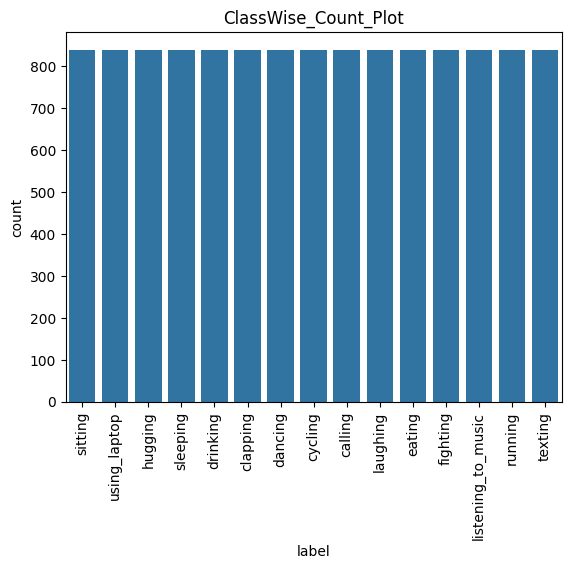

In [7]:
#distribution of classes
#graph
sns.countplot(data=Y_df , x = 'label')
plt.title("ClassWise_Count_Plot")
plt.tick_params(axis = 'x',labelrotation = 90)
plt.savefig("CountPlot_ClassWise.png")
plt.show()

#equal distribution of pictures across classes

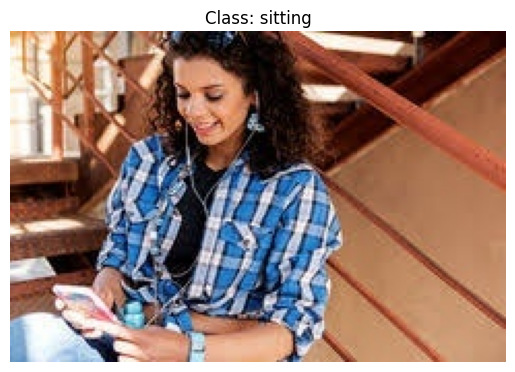

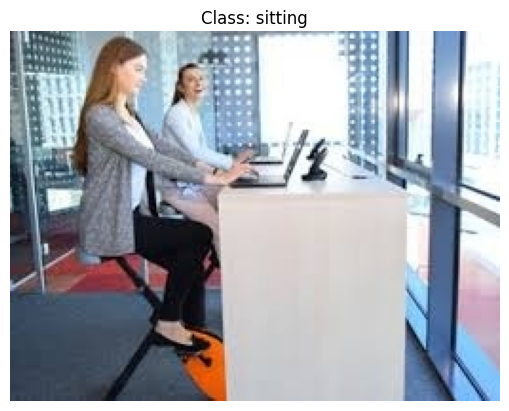

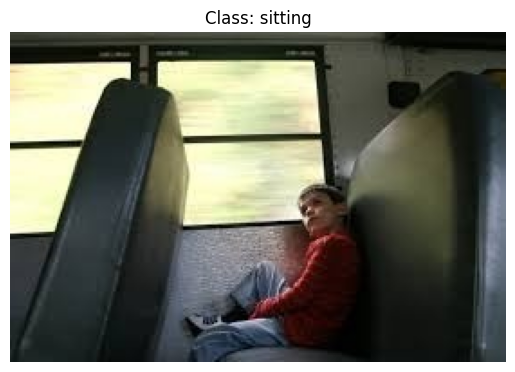

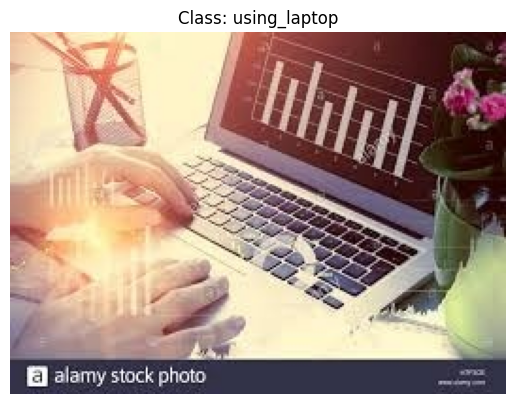

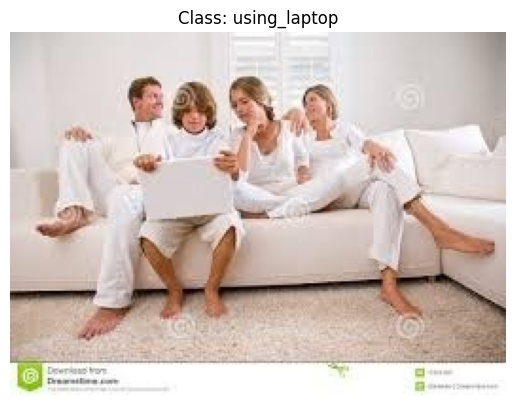

...

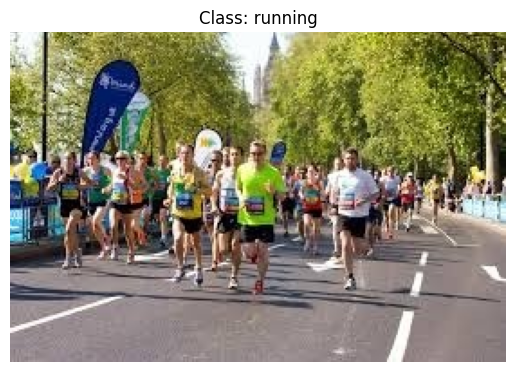

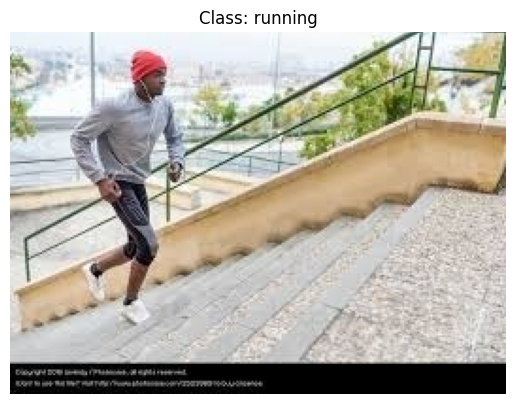

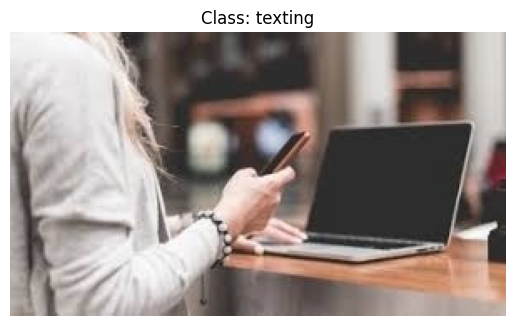

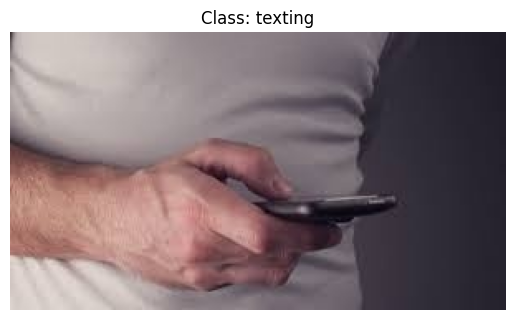

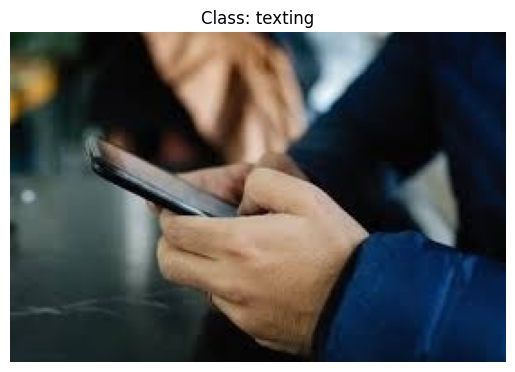

In [8]:
#now i have to print 2 to 3 images per class
for class_type in unique_classes:
    count = 0
    for file in os.listdir(combined_image_path):
        # Print the class type being processed
        if count < 3:  # Limit to 3 images per class
            # Check if the file is in the DataFrame and retrieve the label
            if file in Y_df['filename'].values:  # Check if file exists in Y_df
                label = Y_df.loc[Y_df['filename'] == file, 'label'].values[0]  # Get the label
                
                if label == class_type:  # Check if the label matches the current class
                    # Read image from file path
                    img = cv2.imread(os.path.join(combined_image_path, file))
                    
                    # Convert to Matplotlib format (RGB)
                    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    
                    # Display the image
                    plt.imshow(img_rgb)
                    plt.title(f'Class: {class_type}')  # Optional title
                    plt.axis('off')  # Hide the axes
                    plt.show()
                    
                    count += 1  # Increment the count after displaying the image


In [9]:
# Resize image function
def resize_image(image, target_size=(128, 128)):
    return cv2.resize(image, target_size)

# Feature extraction functions
def extractCorners(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    dst = cv2.cornerHarris(gray, 2, 3, 0.04)
    dst = cv2.dilate(dst, None)
    threshold_value = 0.1 * dst.max()
    corners = np.argwhere(dst > threshold_value)
    return corners.flatten() if corners.size > 0 else np.array([np.nan])  # Return NaN if no corners

def cannyEdgeDetection(image):
    edges = cv2.Canny(image, threshold1=100, threshold2=200)
    return edges.flatten() if edges.size > 0 else np.array([np.nan])  # Return NaN if no edges

def detectContours(image):
    imgray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 127, 255, 0)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        contour_areas = np.array([cv2.contourArea(cnt) for cnt in contours])
        return contour_areas, hierarchy
    return np.array([np.nan]), np.array([np.nan])

def hogImage(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hogfeatures = hog(gray_image, orientations=9, pixels_per_cell=(8, 8),
                      cells_per_block=(2, 2), visualize=False, block_norm='L2-Hys')
    return hogfeatures if hogfeatures.size > 0 else np.array([np.nan])  # Return NaN if no HOG features

def ORBfeatures(image):
    orb = cv2.ORB_create()
    kp = orb.detect(image, None)  # Detect keypoints
    kp, des = orb.compute(image, kp)  # Compute descriptors
    keypoints = np.array([kp[i].pt for i in range(len(kp))])  # Extract keypoint positions
    return keypoints.flatten(), des.flatten() if des is not None else np.array([np.nan])  # Return NaN if no descriptors

def extractColorHistogram(image, bins=8):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hist_r = cv2.calcHist([image_rgb], [0], None, [bins], [0, 256])
    hist_g = cv2.calcHist([image_rgb], [1], None, [bins], [0, 256])
    hist_b = cv2.calcHist([image_rgb], [2], None, [bins], [0, 256])
    
    hist_r = hist_r / hist_r.sum()
    hist_g = hist_g / hist_g.sum()
    hist_b = hist_b / hist_b.sum()
    
    histogram = np.concatenate((hist_r.flatten(), hist_g.flatten(), hist_b.flatten()))
    
    return histogram.flatten() if histogram.size > 0 else np.array([np.nan])  # Return NaN if no histogram

# Function to process a single image and return the feature row
def process_image(image, image_in_grayscale, file, label_dict):
    corners = extractCorners(image)
    edges = cannyEdgeDetection(image_in_grayscale)
    contours, hierarchy = detectContours(image)
    hogfeatures = hogImage(image)
    keypoints, des = ORBfeatures(image)  # Get keypoints and descriptors
    color_histogram = extractColorHistogram(image)  # Extract color histogram

    row_data = {
        'Corners': corners,
        'Edges': edges,
        'Contours': contours[0],  # We only need contour areas here
        'Hierarchy': hierarchy.flatten() if hierarchy is not None else np.array([np.nan]),
        'hogFeatures': hogfeatures,
        'Keypoints': keypoints,  # Include keypoints
        'ORBfeatures': des,  # Include ORB descriptors
        'ColorHistogram': color_histogram,
        'Label': label_dict[file]
    }

    return row_data

# Batch processing function that creates separate DataFrames for each feature
def batch_process_images_and_convert(combined_image_path, label_dict, batch_size=200):
    image_files = os.listdir(combined_image_path)
    total_files = len(image_files)

    # Creating separate lists for each feature and label
    X_Corners, X_Edges, X_Contours, X_Hierarchy, X_hogFeatures, X_Keypoints, X_ORBfeatures, X_ColorHistogram = [], [], [], [], [], [], [], []
    Y_Corners, Y_Edges, Y_Contours, Y_Hierarchy, Y_hogFeatures, Y_Keypoints, Y_ORBfeatures, Y_ColorHistogram = [], [], [], [], [], [], [], []

    for i in range(0, total_files, batch_size):
        batch_files = image_files[i:i + batch_size]
        print(f"Processing batch {i // batch_size + 1} of {total_files // batch_size + 1}")

        for file in batch_files:
            image_path = os.path.join(combined_image_path, file)
            if file not in label_dict:
                continue

            image = cv2.imread(image_path)
            image_in_grayscale = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            # Resize both images to target size
            image = resize_image(image)
            image_in_grayscale = resize_image(image_in_grayscale)

            # Process the image
            row_data = process_image(image, image_in_grayscale, file, label_dict)

            # Append features and labels to corresponding lists
            X_Corners.append(row_data['Corners'])
            X_Edges.append(row_data['Edges'])
            X_Contours.append(row_data['Contours'])
            X_Hierarchy.append(row_data['Hierarchy'])
            X_hogFeatures.append(row_data['hogFeatures'])
            X_Keypoints.append(row_data['Keypoints'])
            X_ORBfeatures.append(row_data['ORBfeatures'])
            X_ColorHistogram.append(row_data['ColorHistogram'])

            # Append labels
            Y_Corners.append(row_data['Label'])
            Y_Edges.append(row_data['Label'])
            Y_Contours.append(row_data['Label'])
            Y_Hierarchy.append(row_data['Label'])
            Y_hogFeatures.append(row_data['Label'])
            Y_Keypoints.append(row_data['Label'])
            Y_ORBfeatures.append(row_data['Label'])
            Y_ColorHistogram.append(row_data['Label'])

    # Convert feature lists into DataFrames
    X_Corners_df = pd.DataFrame(X_Corners)
    X_Edges_df = pd.DataFrame(X_Edges)
    X_Contours_df = pd.DataFrame(X_Contours)
    X_Hierarchy_df = pd.DataFrame(X_Hierarchy)
    X_hogFeatures_df = pd.DataFrame(X_hogFeatures)
    X_Keypoints_df = pd.DataFrame(X_Keypoints)
    X_ORBfeatures_df = pd.DataFrame(X_ORBfeatures)
    X_ColorHistogram_df = pd.DataFrame(X_ColorHistogram)

    # Convert label lists into DataFrames
    Y_Corners_df = pd.DataFrame(Y_Corners, columns=['Label'])
    Y_Edges_df = pd.DataFrame(Y_Edges, columns=['Label'])
    Y_Contours_df = pd.DataFrame(Y_Contours, columns=['Label'])
    Y_Hierarchy_df = pd.DataFrame(Y_Hierarchy, columns=['Label'])
    Y_hogFeatures_df = pd.DataFrame(Y_hogFeatures, columns=['Label'])
    Y_Keypoints_df = pd.DataFrame(Y_Keypoints, columns=['Label'])
    Y_ORBfeatures_df = pd.DataFrame(Y_ORBfeatures, columns=['Label'])
    Y_ColorHistogram_df = pd.DataFrame(Y_ColorHistogram, columns=['Label'])

    return {
        'X_Corners': X_Corners_df, 'Y_Corners': Y_Corners_df,
        'X_Edges': X_Edges_df, 'Y_Edges': Y_Edges_df,
        'X_Contours': X_Contours_df, 'Y_Contours': Y_Contours_df,
        'X_Hierarchy': X_Hierarchy_df, 'Y_Hierarchy': Y_Hierarchy_df,
        'X_hogFeatures': X_hogFeatures_df, 'Y_hogFeatures': Y_hogFeatures_df,
        'X_Keypoints': X_Keypoints_df, 'Y_Keypoints': Y_Keypoints_df,
        'X_ORBfeatures': X_ORBfeatures_df, 'Y_ORBfeatures': Y_ORBfeatures_df,
        'X_ColorHistogram': X_ColorHistogram_df, 'Y_ColorHistogram': Y_ColorHistogram_df
    }

# Usage example
label_dict = dict(zip(Y_df['filename'], Y_df['label']))

# Process images and extract separate DataFrames for each feature
feature_dataframes = batch_process_images_and_convert(combined_image_path, label_dict, batch_size=200)

Processing batch 1 of 64
Processing batch 2 of 64
Processing batch 3 of 64
Processing batch 4 of 64
Processing batch 5 of 64
Processing batch 6 of 64
Processing batch 7 of 64
Processing batch 8 of 64
Processing batch 9 of 64
Processing batch 10 of 64
Processing batch 11 of 64
Processing batch 12 of 64
Processing batch 13 of 64
Processing batch 14 of 64
Processing batch 15 of 64
Processing batch 16 of 64
Processing batch 17 of 64
Processing batch 18 of 64
Processing batch 19 of 64
Processing batch 20 of 64
Processing batch 21 of 64
Processing batch 22 of 64
Processing batch 23 of 64
Processing batch 24 of 64
Processing batch 25 of 64
Processing batch 26 of 64
Processing batch 27 of 64
Processing batch 28 of 64
Processing batch 29 of 64
Processing batch 30 of 64
Processing batch 31 of 64
Processing batch 32 of 64
Processing batch 33 of 64
Processing batch 34 of 64
Processing batch 35 of 64
Processing batch 36 of 64
Processing batch 37 of 64
Processing batch 38 of 64
Processing batch 39 o

In [10]:
# Now, you have separate DataFrames for each feature and their corresponding labels
X_Corners = feature_dataframes['X_Corners']
Y_Corners = feature_dataframes['Y_Corners']
X_Edges = feature_dataframes['X_Edges']
Y_Edges = feature_dataframes['Y_Edges']
X_Contours = feature_dataframes['X_Contours'] 
Y_Contours = feature_dataframes['Y_Contours']
X_Hierarchy = feature_dataframes['X_Hierarchy']
Y_Hierarchy = feature_dataframes['Y_Hierarchy']
X_hogFeatures = feature_dataframes['X_hogFeatures']
Y_hogFeatures = feature_dataframes['Y_hogFeatures']
X_Keypoints = feature_dataframes['X_Keypoints']
Y_Keypoints = feature_dataframes['Y_Keypoints']
X_ORBfeatures = feature_dataframes['X_ORBfeatures']
Y_ORBfeatures = feature_dataframes['Y_ORBfeatures']
X_ColorHistogram = feature_dataframes['X_ColorHistogram']
Y_ColorHistogram = feature_dataframes['Y_ColorHistogram']

In [11]:
# List of features to split
features_list = ['Corners', 'Edges', 'Contours', 'Hierarchy', 'hogFeatures', 'Keypoints', 'ORBfeatures', 'ColorHistogram']

# Initialize dictionaries to store the train and test splits for each feature
X_train_dict = {}
X_test_dict = {}
Y_train_dict = {}
Y_test_dict = {}

for feature in features_list:
    X = feature_dataframes[f'X_{feature}']  
    Y = feature_dataframes[f'Y_{feature}']  
    
    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_imputed = imputer.fit_transform(X)
    
    # Perform the train-test split
    X_train, X_test, Y_train, Y_test = train_test_split(X_imputed, Y, test_size=0.2, random_state=42)
    
    # Store the results in dictionaries
    X_train_dict[f"X_train_{feature}"] = X_train
    X_test_dict[f"X_test_{feature}"] = X_test
    Y_train_dict[f"Y_train_{feature}"] = Y_train
    Y_test_dict[f"Y_test_{feature}"] = Y_test

In [27]:
for feature in features_list:
    # Access the dictionary for features
    X_train = X_train_dict[f"X_train_{feature}"]
    X_test = X_test_dict[f"X_test_{feature}"]
    Y_train = Y_train_dict[f"Y_train_{feature}"]
    Y_test = Y_test_dict[f"Y_test_{feature}"] 
    
    # Train model here 
    print(f"Using feature: {feature}")
    
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)  # Scale training data
    X_test_scaled = scaler.transform(X_test)  # Scale test data
    
    rf = RandomForestClassifier(n_estimators=100, random_state=42)

    # Fit the model using scaled data
    rf.fit(X_train_scaled, Y_train)  # Use X_train_scaled

    # Make predictions
    y_pred = rf.predict(X_test_scaled)  # Use X_test_scaled

    # Evaluate the model
    accuracy = accuracy_score(Y_test, y_pred)
    print(f"Accuracy: {accuracy * 100:.2f}%")
    print("\n")

Using feature: Corners


C:\Users\bchaw\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Accuracy: 15.48%


Using feature: Edges


C:\Users\bchaw\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Accuracy: 15.20%


Using feature: Contours


C:\Users\bchaw\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Accuracy: 8.81%


Using feature: Hierarchy


C:\Users\bchaw\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Accuracy: 13.25%


Using feature: hogFeatures


C:\Users\bchaw\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Accuracy: 21.98%


Using feature: Keypoints


C:\Users\bchaw\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Accuracy: 13.37%


Using feature: ORBfeatures


C:\Users\bchaw\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Accuracy: 12.10%


Using feature: ColorHistogram


C:\Users\bchaw\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Accuracy: 22.82%




In [13]:
# Resize image function
def resize_image(image, target_size=(128, 128)):
    return cv2.resize(image, target_size)

# Feature extraction functions
def cannyEdgeDetection(image):
    edges = cv2.Canny(image, threshold1=100, threshold2=200)
    return edges.flatten() if edges.size > 0 else np.array([np.nan])  # Return NaN if no edges

def hogImage(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hogfeatures = hog(gray_image, orientations=9, pixels_per_cell=(8, 8),
                      cells_per_block=(2, 2), visualize=False, block_norm='L2-Hys')
    return hogfeatures if hogfeatures.size > 0 else np.array([np.nan])  # Return NaN if no HOG features

def extractColorHistogram(image, bins=8):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hist_r = cv2.calcHist([image_rgb], [0], None, [bins], [0, 256])
    hist_g = cv2.calcHist([image_rgb], [1], None, [bins], [0, 256])
    hist_b = cv2.calcHist([image_rgb], [2], None, [bins], [0, 256])
    
    hist_r = hist_r / hist_r.sum()
    hist_g = hist_g / hist_g.sum()
    hist_b = hist_b / hist_b.sum()
    
    histogram = np.concatenate((hist_r.flatten(), hist_g.flatten(), hist_b.flatten()))
    
    return histogram.flatten() if histogram.size > 0 else np.array([np.nan])  # Return NaN if no histogram

# LBP feature extraction
def extractLBP(image, radius=1, n_points=8):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    lbp = local_binary_pattern(gray_image, n_points * radius, radius, method='uniform')
    (hist, _) = np.histogram(lbp.ravel(),
                             bins=np.arange(0, n_points + 3),
                             range=(0, n_points + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)  # Normalize the histogram
    return hist.flatten() if hist.size > 0 else np.array([np.nan])

# Gabor filter feature extraction
def extractGaborFeatures(image, frequencies=(0.6,), orientations=8):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gabor_features = []
    for frequency in frequencies:
        for theta in range(orientations):
            theta_rad = theta / orientations * np.pi  # Convert to radians
            real, _ = gabor(gray_image, frequency=frequency, theta=theta_rad)
            gabor_features.append(real.mean())  # Use mean of real part as a feature
    return np.array(gabor_features) if gabor_features else np.array([np.nan])

# Function to process a single image and return the feature row
def process_image(image, image_in_grayscale, file, label_dict):
    edges = cannyEdgeDetection(image_in_grayscale)
    hogfeatures = hogImage(image)
    color_histogram = extractColorHistogram(image)
    lbp_features = extractLBP(image)
    gabor_features = extractGaborFeatures(image)

    row_data = {
        'Edges': edges,
        'hogFeatures': hogfeatures,
        'ColorHistogram': color_histogram,
        'LBP': lbp_features,
        'Gabor': gabor_features,
        'Label': label_dict[file]
    }

    return row_data

# Batch processing function that also converts feature arrays in batches
def batch_process_images_and_convert(combined_image_path, label_dict, batch_size=200):
    image_files = os.listdir(combined_image_path)
    total_files = len(image_files)

    for i in range(0, total_files, batch_size):
        batch_files = image_files[i:i + batch_size]
        print(f"Processing batch {i // batch_size + 1} of {total_files // batch_size + 1}")

        rows_list = []
        for file in batch_files:
            image_path = os.path.join(combined_image_path, file)
            if file not in label_dict:
                continue

            image = cv2.imread(image_path)
            image_in_grayscale = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            # Resize both images to target size
            image = resize_image(image)
            image_in_grayscale = resize_image(image_in_grayscale)

            # Process the image and append the row
            row_data = process_image(image, image_in_grayscale, file, label_dict)
            rows_list.append(row_data)

        # After processing the batch, convert features for the batch
        batch_df = pd.DataFrame(rows_list)
        X_converted_batch = []
        for _, row in batch_df.iterrows():
            row_features = []
            for feature in ['Edges', 'hogFeatures', 'ColorHistogram', 'LBP', 'Gabor']:
                if isinstance(row[feature], np.ndarray):
                    row_features.extend(row[feature])  # No maximum limit
                else:
                    row_features.extend([np.nan])  # Fill with NaN if not available
            X_converted_batch.append(row_features)

        # Convert batch features to a consistent numpy array and yield it
        X_batch = np.array(X_converted_batch, dtype=np.float32)  # Use float32 for numerical stability
        yield X_batch, batch_df['Label'].values  # Yield features and labels for the batch

# Usage example
final_X = []
final_Y = []

label_dict = dict(zip(Y_df['filename'], Y_df['label']))

for X_batch, Y_batch in batch_process_images_and_convert(combined_image_path, label_dict, batch_size=200):
    final_X.append(X_batch)
    final_Y.append(Y_batch)

# After processing all batches, concatenate the results
final_X = np.concatenate(final_X, axis=0)  # Final X as a numpy array
final_Y = np.concatenate(final_Y, axis=0)  # Final Y as a numpy array

Processing batch 1 of 64
Processing batch 2 of 64
Processing batch 3 of 64
Processing batch 4 of 64
Processing batch 5 of 64
Processing batch 6 of 64
Processing batch 7 of 64
Processing batch 8 of 64
Processing batch 9 of 64
Processing batch 10 of 64
Processing batch 11 of 64
Processing batch 12 of 64
Processing batch 13 of 64
Processing batch 14 of 64
Processing batch 15 of 64
Processing batch 16 of 64
Processing batch 17 of 64
Processing batch 18 of 64
Processing batch 19 of 64
Processing batch 20 of 64
Processing batch 21 of 64
Processing batch 22 of 64
Processing batch 23 of 64
Processing batch 24 of 64
Processing batch 25 of 64
Processing batch 26 of 64
Processing batch 27 of 64
Processing batch 28 of 64
Processing batch 29 of 64
Processing batch 30 of 64
Processing batch 31 of 64
Processing batch 32 of 64
Processing batch 33 of 64
Processing batch 34 of 64
Processing batch 35 of 64
Processing batch 36 of 64
Processing batch 37 of 64
Processing batch 38 of 64
Processing batch 39 o

In [14]:
# Replace NaN values with the mean of each column
imputer = SimpleImputer(strategy='constant', fill_value=0)
X_imputed = imputer.fit_transform(final_X)

In [15]:
encoder = LabelEncoder()
Y_encoded = encoder.fit_transform(final_Y)

In [16]:
X_train, X_test, Y_train, Y_test = train_test_split(X_imputed, Y_encoded, test_size=0.2, random_state=42)

In [17]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [30]:
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train_scaled, Y_train)
y_pred = dt_classifier.predict(X_test)
accuracy = accuracy_score(Y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')

Accuracy: 12.30%


In [18]:
# Initialize the RandomForestClassifier
rf = RandomForestClassifier(n_estimators=1000 , max_depth = 10, random_state=42)

# Fit the model
rf.fit(X_train_scaled, Y_train)

# Make predictions
Y_pred = rf.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(Y_test, Y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 27.62%


In [19]:
gnb = GaussianNB()

gnb.fit(X_train_scaled,Y_train)

y_pred_gaussian = gnb.predict(X_test_scaled)

accuracy_gaussian = accuracy_score(Y_test , y_pred_gaussian)

print("accuracy:",accuracy_gaussian * 100)

accuracy: 23.055555555555557


In [20]:
bnb = BernoulliNB()

bnb.fit(X_train_scaled,Y_train)

y_pred_bernoulli = bnb.predict(X_test_scaled)

accuracy_bernoulli = accuracy_score(Y_test , y_pred_bernoulli)

print("accuracy:",accuracy_bernoulli * 100)

accuracy: 23.65079365079365


In [21]:
gnb_clf = GaussianNB()
bnb_clf = BernoulliNB()

voting_clf = VotingClassifier(estimators=[
    ('bnb', bnb_clf),
    ('gnb', gnb_clf)
], voting='soft')  #soft

voting_clf.fit(X_train_scaled, Y_train)

# Make predictions
y_pred_vote_g_b = voting_clf.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred_vote_g_b)
print(f"Voting Classifier Accuracy (BernoulliNB + GaussianNB): {accuracy * 100:.4f}")

Voting Classifier Accuracy (BernoulliNB + GaussianNB): 23.5714


In [22]:
xgb=XGBClassifier(random_state = 42)
xgb.fit(X_train_scaled,Y_train)
y_pred=xgb.predict(X_test_scaled)
print(accuracy_score(Y_test,y_pred) * 100)

with open("best_model.pkl" , "wb") as file:
    pkl.dump(xgb,file)

print("model saved successfuly!")

31.98412698412698
model saved successfuly!


In [23]:
with open("C:\\Users\\bchaw\\Downloads\\best_model.pkl", 'rb') as file:
    loaded_model = pkl.load(file)

# Now you can use the loaded model to make predictions
y_pred_loaded = loaded_model.predict(X_test_scaled)

# Print accuracy with loaded model
print("Loaded Model Accuracy:", accuracy_score(Y_test, y_pred_loaded) * 100)

Loaded Model Accuracy: 31.98412698412698


In [25]:
# RFE object: Selecting top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=3)